# Random Analysis

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import os

sns.set_theme()

In [2]:
folderPath = '..\\..\\..\\..\\dataset\\Pirate'

X_train = pd.read_csv(os.path.join(folderPath, 'pirate_pain_train.csv'))
y_train = pd.read_csv(os.path.join(folderPath, 'pirate_pain_train_labels.csv'))

X_test = pd.read_csv(os.path.join(folderPath, 'pirate_pain_test.csv'))

In [3]:
X_train.head()

,sample_index,time,pain_survey_1,pain_survey_2,pain_survey_3,pain_survey_4,n_legs,n_hands,n_eyes,joint_00,...,joint_21,joint_22,joint_23,joint_24,joint_25,joint_26,joint_27,joint_28,joint_29,joint_30
0,0,0,2,0,2,1,two,two,two,1.094705,...,3.499558e-06,1.945042e-06,0.000004,1.153299e-05,0.000004,0.017592,0.013508,0.026798,0.027815,0.5
1,0,1,2,2,2,2,two,two,two,1.135183,...,3.976952e-07,6.765107e-07,0.000006,4.643774e-08,0.000000,0.013352,0.000000,0.013377,0.013716,0.5
2,0,2,2,0,2,2,two,two,two,1.080745,...,1.533820e-07,1.698525e-07,0.000001,2.424536e-06,0.000003,0.016225,0.008110,0.024097,0.023105,0.5
3,0,3,2,2,2,2,two,two,two,0.938017,...,1.006865e-05,5.511079e-07,0.000002,5.432416e-08,0.000000,0.011832,0.007450,0.028613,0.024648,0.5
4,0,4,2,2,2,2,two,two,two,1.090185,...,4.437266e-06,1.735459e-07,0.000002,5.825366e-08,0.000007,0.005360,0.002532,0.033026,0.025328,0.5


In [4]:
X_train = X_train.drop(columns=['n_legs', 'n_hands', 'n_eyes', 'joint_30'])

In [5]:
# convert non-numeric columns in X_train to integer indices and apply same mapping to X_test (if present)
non_numeric_cols = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
mappings = {}

for col in non_numeric_cols:
    cat = X_train[col].astype('category')
    X_train[col] = cat.cat.codes
    code_to_cat = dict(enumerate(cat.cat.categories))
    cat_to_code = {v: k for k, v in code_to_cat.items()}
    mappings[col] = {'code_to_category': code_to_cat, 'category_to_code': cat_to_code}
    if col in X_test.columns:
        X_test[col] = pd.Categorical(X_test[col], categories=cat.cat.categories).codes

# show what was converted and the mappings
non_numeric_cols, mappings

([], {})

In [6]:
featureNames = X_train.columns[2:].tolist()

data = X_train.pivot(index='sample_index', columns='time', values=featureNames).to_numpy()
# build (n_samples, n_times, n_features) array by stacking per-feature pivot outputs
data = np.stack([X_train.pivot(index='sample_index', columns='time', values=feat).to_numpy()
                 for feat in featureNames], axis=-1)
data.shape

(661, 160, 34)

In [7]:
data[0, :, 0]

array([2., 2., 2., 2., 2., 2., 2., 2., 2., 0., 2., 2., 2., 2., 2., 2., 2.,
       2., 2., 2., 2., 1., 2., 0., 1., 0., 0., 0., 1., 2., 0., 2., 2., 2.,
       2., 2., 2., 1., 2., 2., 2., 2., 0., 2., 0., 2., 2., 2., 2., 1., 2.,
       2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 0., 2., 2., 0., 2.,
       2., 2., 2., 0., 2., 2., 2., 2., 0., 2., 2., 2., 2., 2., 2., 2., 2.,
       0., 2., 0., 0., 2., 2., 0., 2., 2., 2., 0., 2., 2., 2., 0., 2., 2.,
       2., 2., 2., 2., 2., 2., 2., 0., 2., 0., 1., 2., 2., 0., 2., 0., 2.,
       2., 2., 2., 2., 2., 2., 2., 2., 0., 2., 2., 0., 2., 0., 1., 2., 2.,
       2., 2., 2., 2., 0., 2., 2., 2., 2., 2., 2., 2., 0., 2., 2., 1., 2.,
       2., 2., 2., 2., 2., 2., 2.])

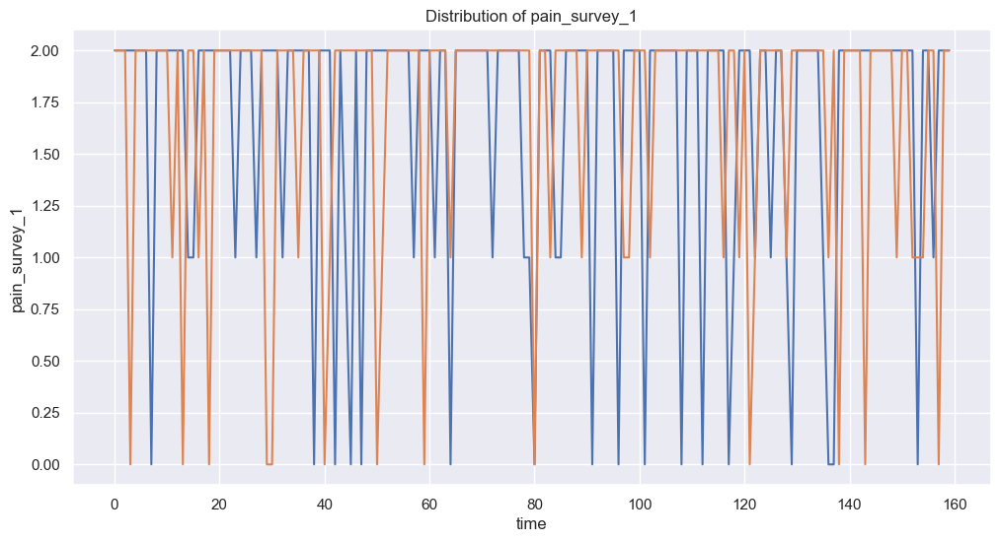

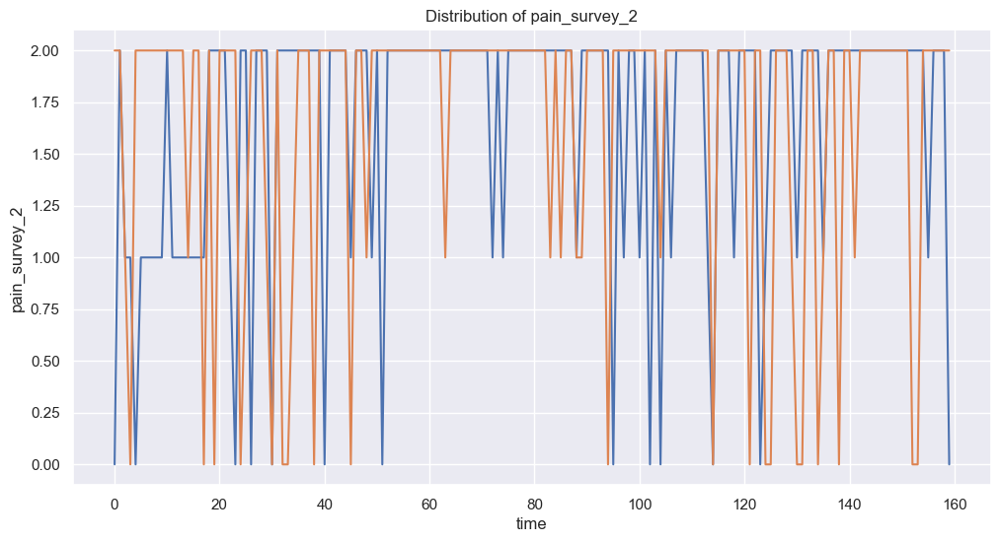

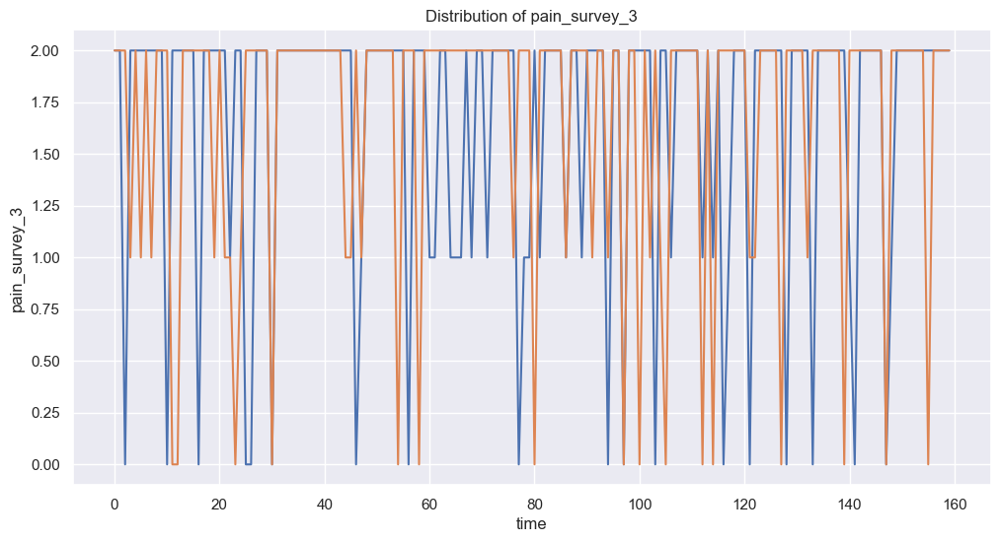

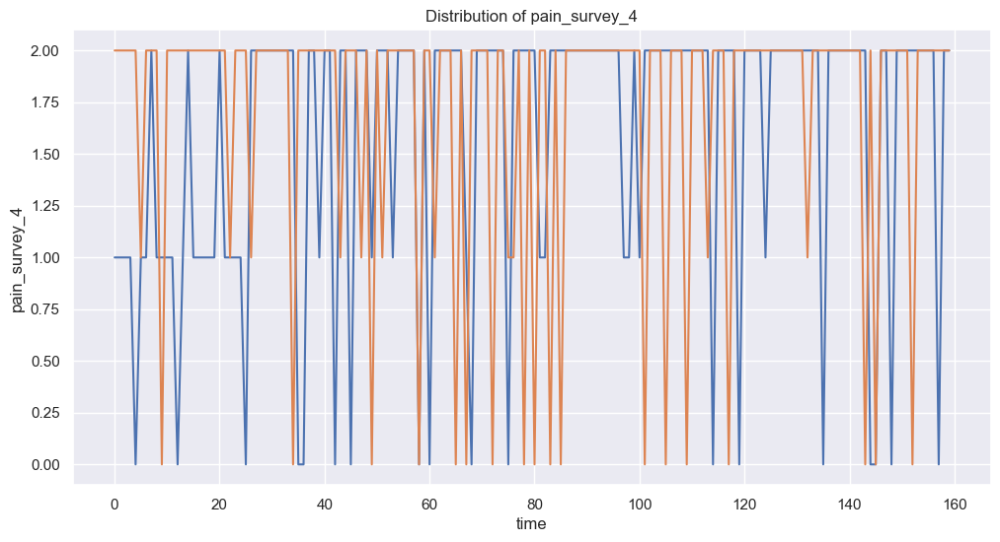

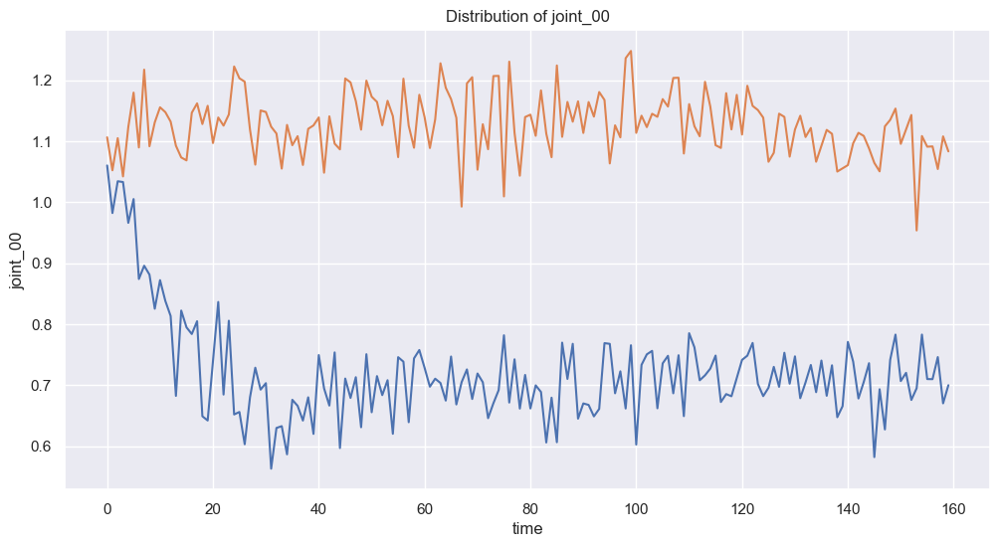

...

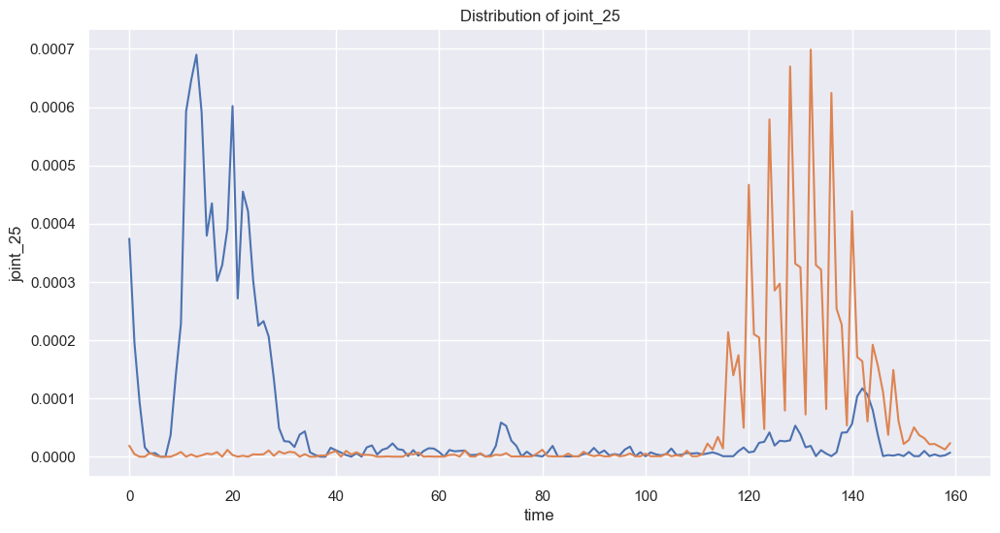

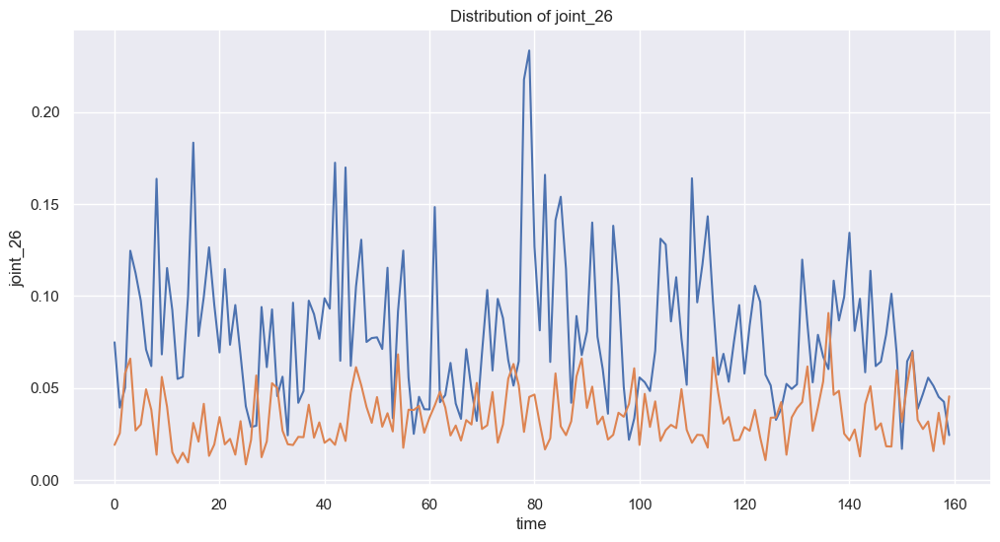

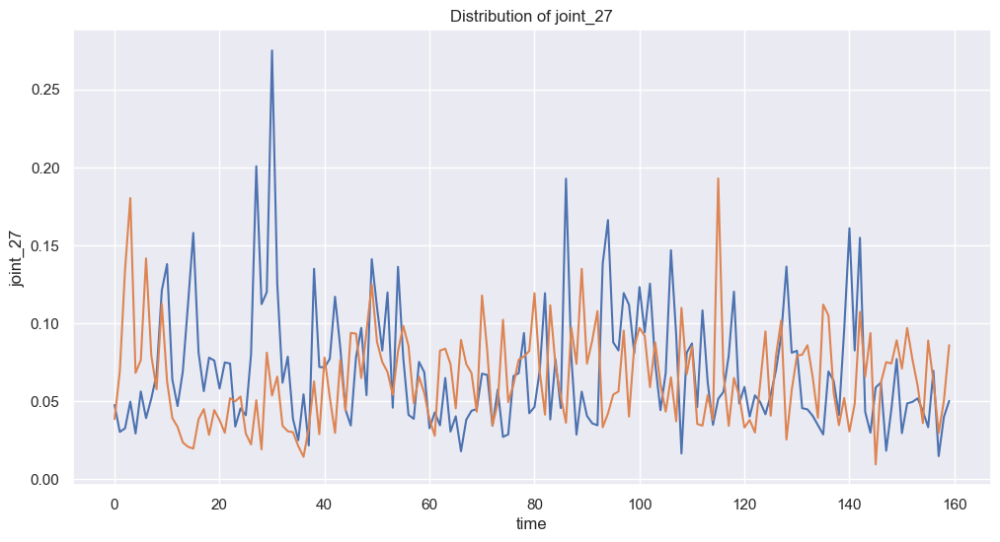

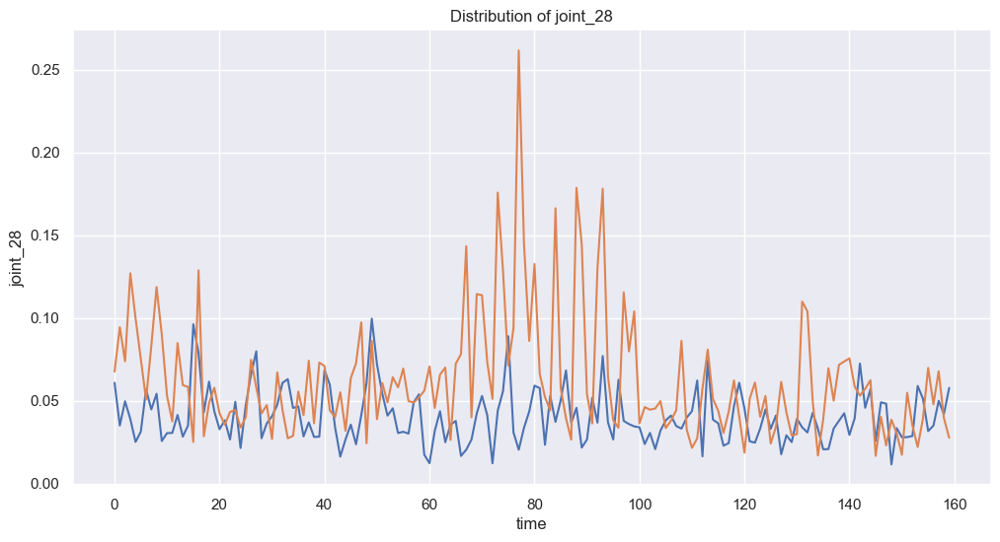

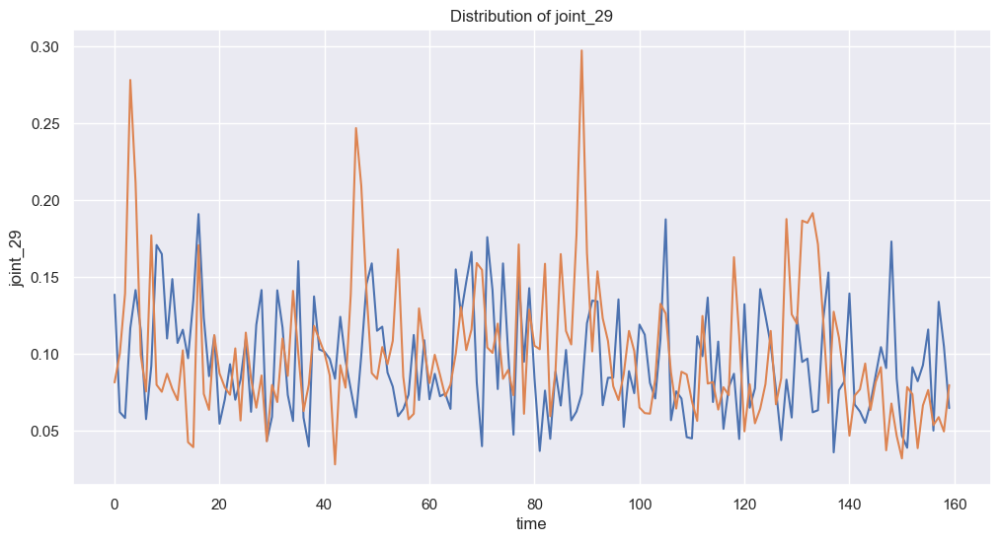

In [8]:
samples = 2
sampledIndices = np.random.choice(data.shape[0], samples, replace=False)
for i, featureName in enumerate(featureNames):
    plt.figure(figsize=(12, 6))
    try:
        plt.plot(data[sampledIndices, :, i].T)
    except Exception as e:
        print(f"Could not plot feature {featureName} due to error: {e}")
    plt.title(f'Distribution of {featureName}')
    plt.ylabel(featureName)
    plt.xlabel('time')
    plt.show()

In [9]:
means = np.mean(data, axis=1)
means.shape

(661, 34)

In [10]:
dataY = y_train.to_numpy()
dataY

array([[0, 'no_pain'],
       [1, 'no_pain'],
       [2, 'low_pain'],
       ...,
       [658, 'no_pain'],
       [659, 'no_pain'],
       [660, 'no_pain']], shape=(661, 2), dtype=object)

In [11]:
labels = y_train['label'].unique()
labels

array(['no_pain', 'low_pain', 'high_pain'], dtype=object)

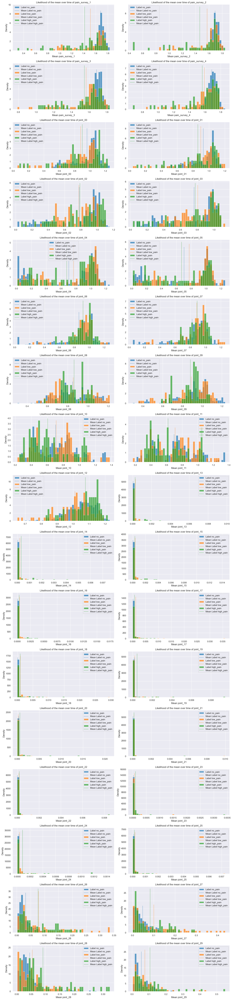

In [12]:
# Plot histograms of standard deviations for each feature, separated by label
binNumber = 50
ncols = 2
nrows = int(np.ceil(len(featureNames) / ncols))
fig, axs = plt.subplots(nrows, ncols, figsize=(16, 4 * nrows))

# flatten axes for easy indexing (handle single-Axes case as well)
axs_flat = axs.flatten() if isinstance(axs, np.ndarray) else np.array([axs])

for i, feature in enumerate(featureNames):
    ax = axs_flat[i]
    plt.sca(ax)
    # use consistent bins across labels for this feature
    feat_vals = means[:, i]
    min_val, max_val = np.nanmin(feat_vals), np.nanmax(feat_vals)
    if min_val == max_val:
        bins = np.linspace(min_val - 0.5, max_val + 0.5, binNumber)
    else:
        bins = np.linspace(min_val, max_val, binNumber)
    # enumerate labels to pick a numeric index for colormap
    for li, label in enumerate(labels):
        label_indices = y_train[y_train['label'] == label].index
        color = plt.get_cmap('tab10')(li % 10)  # cycle through tab10 colors safely
        plt.hist(feat_vals[label_indices], bins=bins, alpha=0.7, label=f'Label {label}', density=True, color=color)
        mean_val = np.mean(feat_vals[label_indices])
        ymax = ax.get_ylim()[1]
        plt.vlines(mean_val, linestyle='dashed', linewidth=1, ymin=0, ymax=ymax,
                   label=f'Mean Label {label}', color=color)
    plt.title(f'Likelihood of the mean over time of {feature}')
    plt.xlabel('Mean ' + feature)
    plt.ylabel('Density')
    plt.legend()

# hide any unused axes if there are more subplots than features
for ax in axs_flat[len(featureNames):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

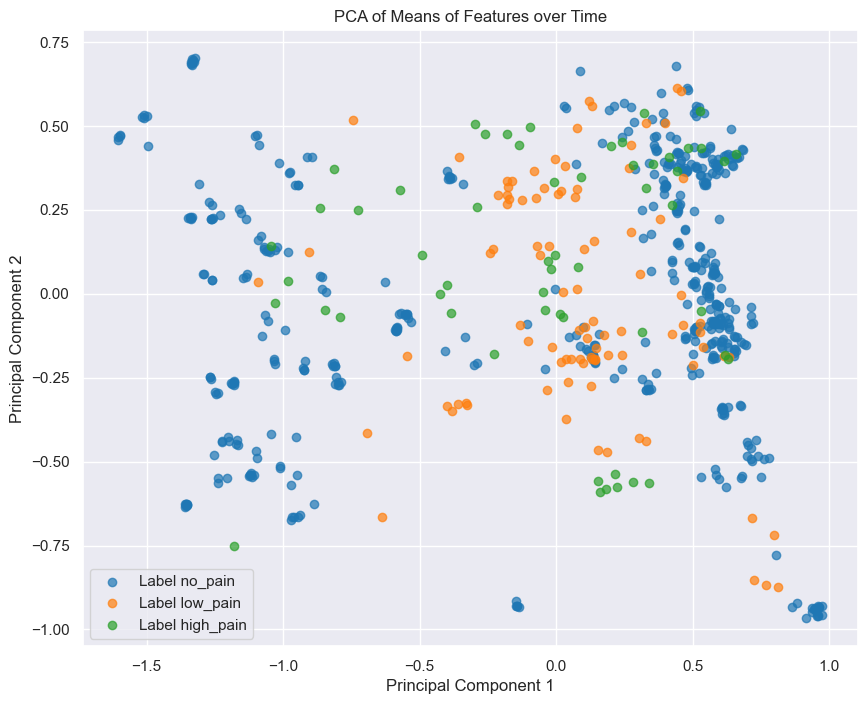

In [13]:
# Perform PCa over the means and plot the first 2 principal components
centeredMeans = means - np.mean(means, axis=0)
U, s, Vt = np.linalg.svd(centeredMeans, full_matrices=False)
pcMeans = centeredMeans @ Vt.T[:, :2]

plt.figure(figsize=(10, 8))
for li, label in enumerate(labels):
    label_indices = y_train[y_train['label'] == label].index
    color = plt.get_cmap('tab10')(li % 10)  # cycle through tab10 colors safely
    plt.scatter(pcMeans[label_indices, 0], pcMeans[label_indices, 1], label=f'Label {label}', alpha=0.7, color=color)
plt.title('PCA of Means of Features over Time')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

In [14]:
dataFull = data.reshape(data.shape[0], -1)
dataFull.shape

(661, 5440)

In [15]:
meanStd = np.concatenate([means, np.std(data, axis=1)], axis=1)
meanStd.shape

(661, 68)

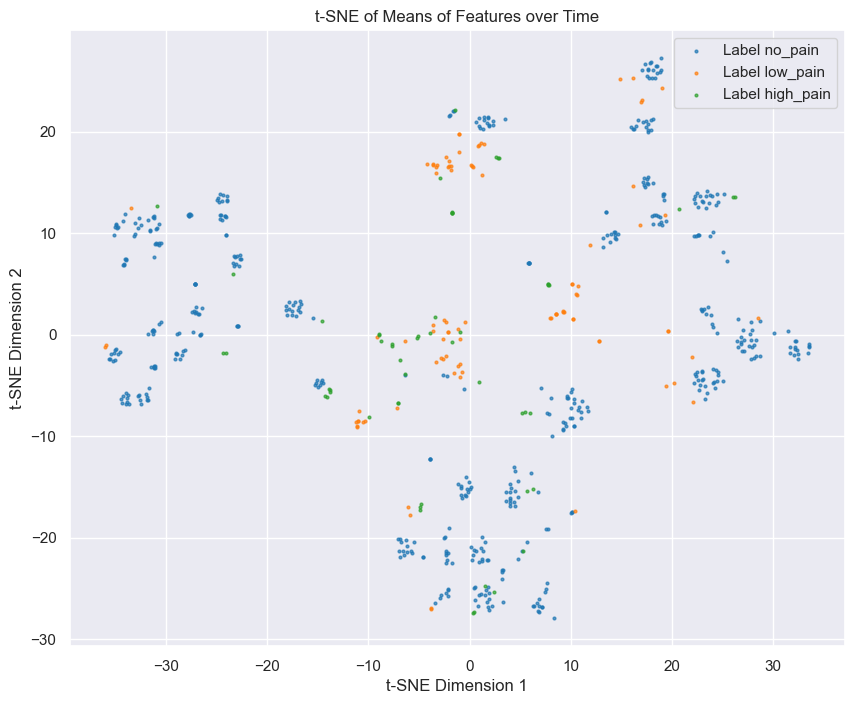

In [16]:
#perform tsne over the means of the features
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=42)
tsneResults = tsne.fit_transform(means)
plt.figure(figsize=(10, 8))
for li, label in enumerate(labels):
    label_indices = y_train[y_train['label'] == label].index
    color = plt.get_cmap('tab10')(li % 10)  # cycle through tab10 colors safely
    plt.scatter(tsneResults[label_indices, 0], tsneResults[label_indices, 1], label=f'Label {label}', alpha=0.7, color=color, s=4)
plt.title('t-SNE of Means of Features over Time')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend()
plt.show()

In [17]:
stds = np.std(data, axis=1)
stds.shape

(661, 34)

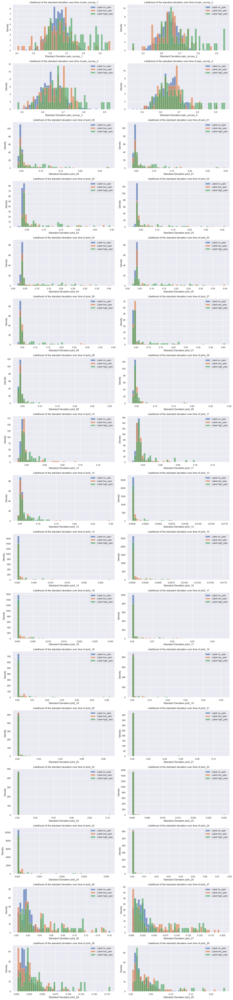

In [18]:
# Plot histograms of standard deviations for each feature, separated by label
binNumber = 50
ncols = 2
nrows = int(np.ceil(len(featureNames) / ncols))
fig, axs = plt.subplots(nrows, ncols, figsize=(16, 4 * nrows))

# flatten axes for easy indexing (handle single-Axes case as well)
axs_flat = axs.flatten() if isinstance(axs, np.ndarray) else np.array([axs])

for i, feature in enumerate(featureNames):
    ax = axs_flat[i]
    plt.sca(ax)
    # use consistent bins across labels for this feature
    feat_vals = stds[:, i]
    min_val, max_val = np.nanmin(feat_vals), np.nanmax(feat_vals)
    if min_val == max_val:
        bins = np.linspace(min_val - 0.5, max_val + 0.5, binNumber)
    else:
        bins = np.linspace(min_val, max_val, binNumber)
    for label in labels:
        label_indices = y_train[y_train['label'] == label].index
        plt.hist(feat_vals[label_indices], bins=bins, alpha=0.7, label=f'Label {label}', density=True)
    plt.title(f'Likelihood of the standard deviation over time of {feature}')
    plt.xlabel('Standard Deviation ' + feature)
    plt.ylabel('Density')
    plt.legend()

# hide any unused axes if there are more subplots than features
for ax in axs_flat[len(featureNames):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

In [19]:
maxAbs = np.max(np.abs(data-means[:, np.newaxis, :]), axis=1)
maxAbs.shape

(661, 34)

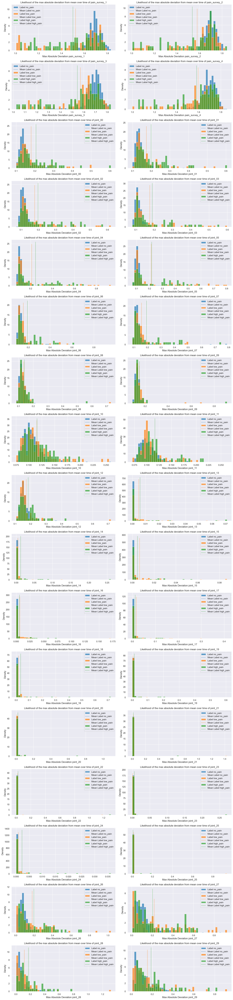

In [20]:
# plot histograms of maxAbs for each feature, separated by label
binNumber = 50
ncols = 2
nrows = int(np.ceil(len(featureNames) / ncols))
fig, axs = plt.subplots(nrows, ncols, figsize=(16, 4 * nrows))
# flatten axes for easy indexing (handle single-Axes case as well)
axs_flat = axs.flatten() if isinstance(axs, np.ndarray) else np.array([axs])
for i, feature in enumerate(featureNames):
    ax = axs_flat[i]
    plt.sca(ax)
    # use consistent bins across labels for this feature
    feat_vals = maxAbs[:, i]
    min_val, max_val = np.nanmin(feat_vals), np.nanmax(feat_vals)
    if min_val == max_val:
        bins = np.linspace(min_val - 0.5, max_val + 0.5, binNumber)
    else:
        bins = np.linspace(min_val, max_val, binNumber)
    for j, label in enumerate(labels):
        label_indices = y_train[y_train['label'] == label].index
        color = plt.get_cmap('tab10')(j % 10)  # cycle through tab10 colors safely
        meanMaxAbs = np.mean(feat_vals[label_indices])
        ymax = ax.get_ylim()[1]
        plt.hist(feat_vals[label_indices], bins=bins, alpha=0.7, label=f'Label {label}', density=True, color=color)
        plt.vlines(meanMaxAbs, linestyle='dashed', linewidth=1, ymin=0, ymax=ymax,
                   label=f'Mean Label {label}', color=color)
    plt.title(f'Likelihood of the max absolute deviation from mean over time of {feature}')
    plt.xlabel('Max Absolute Deviation ' + feature)
    plt.ylabel('Density')
    plt.legend()
# hide any unused axes if there are more subplots than features
for ax in axs_flat[len(featureNames):]:
    ax.set_visible(False)
plt.tight_layout()
plt.show()

In [21]:
data.shape

(661, 160, 34)

In [22]:
a = data[:, :, 0].T
a.shape

(160, 661)

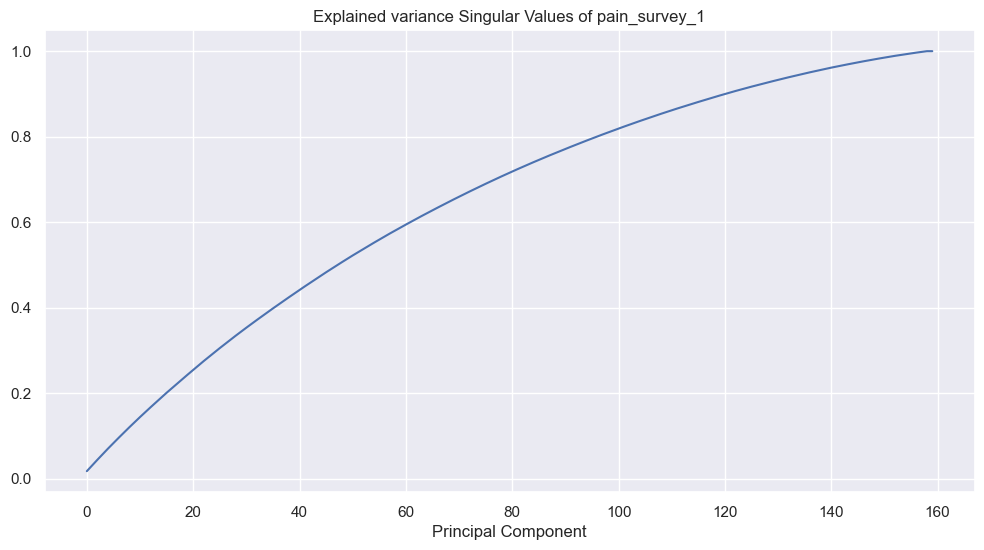

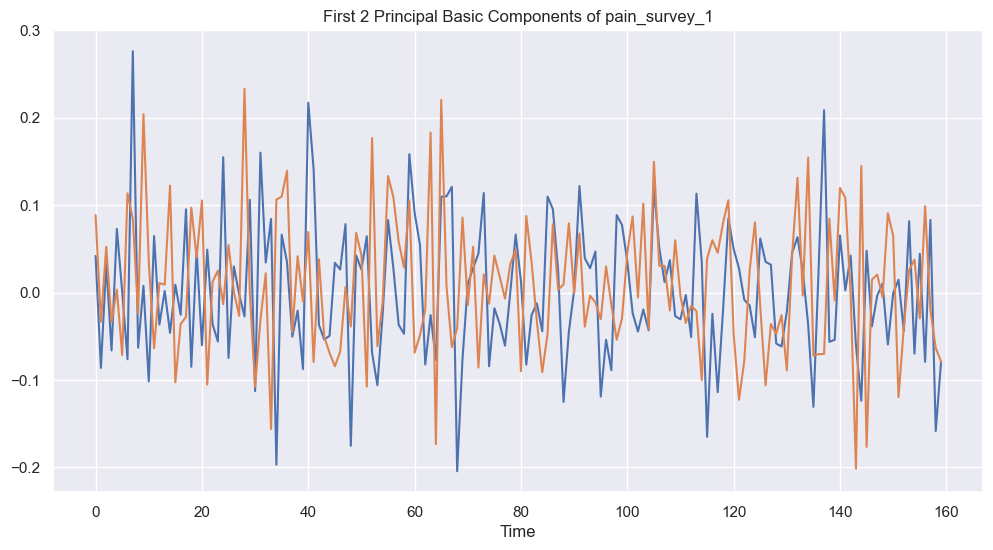

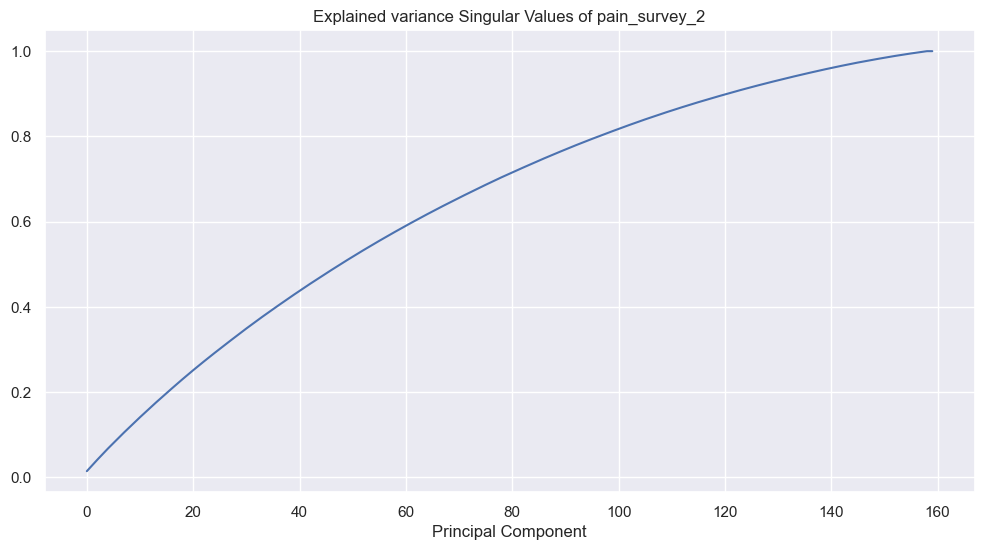

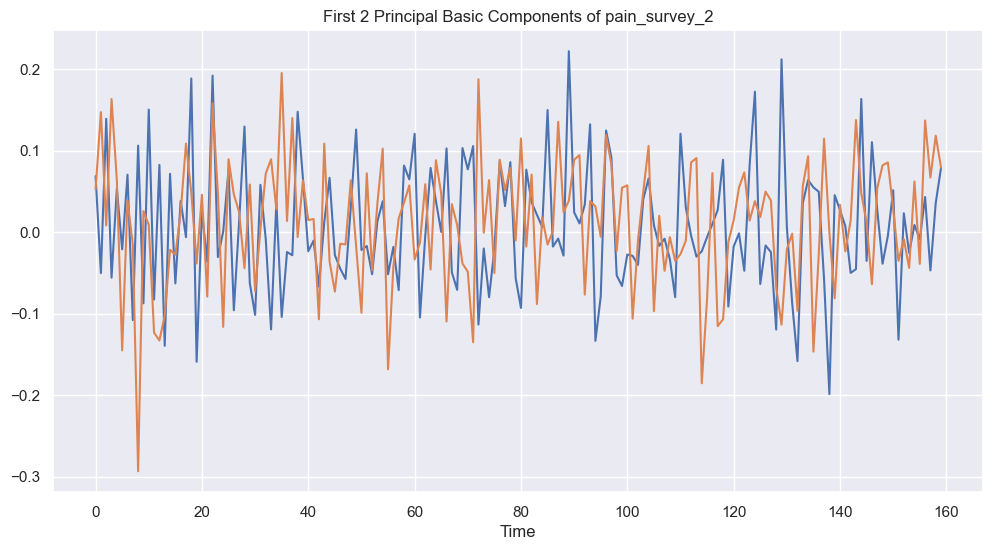

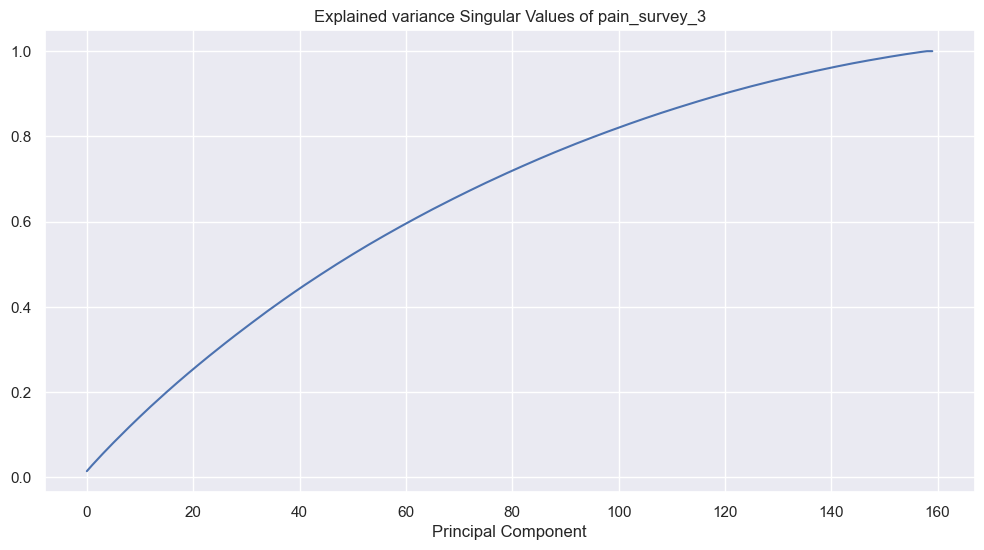

...

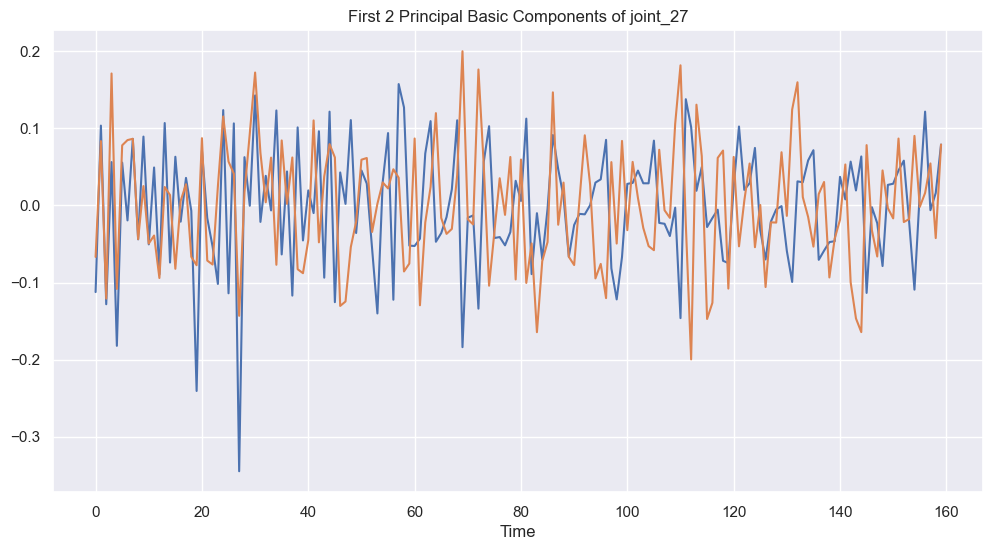

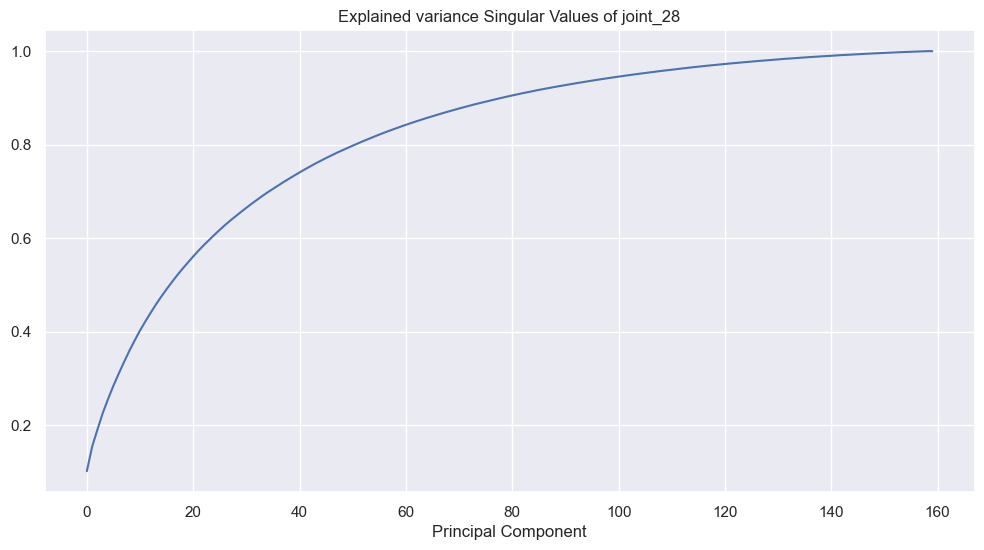

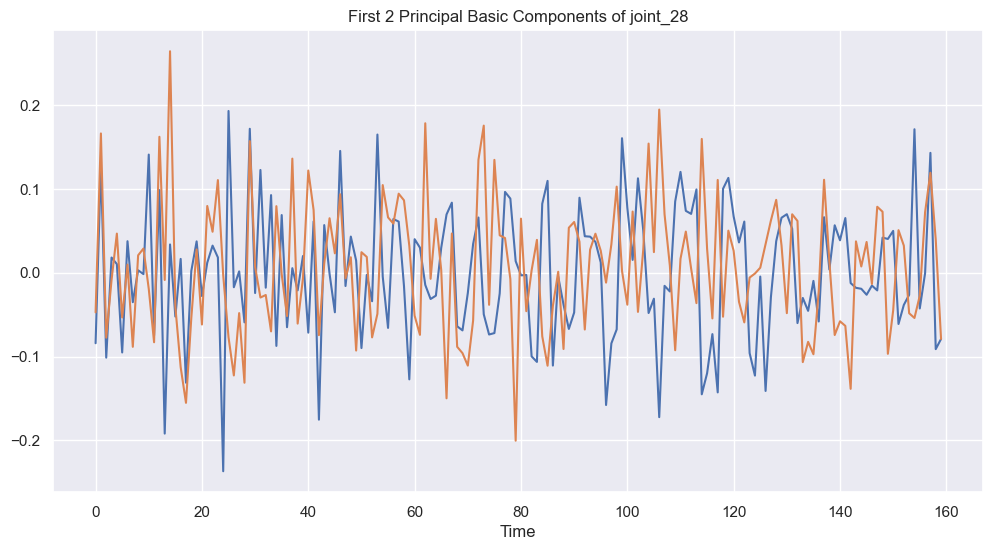

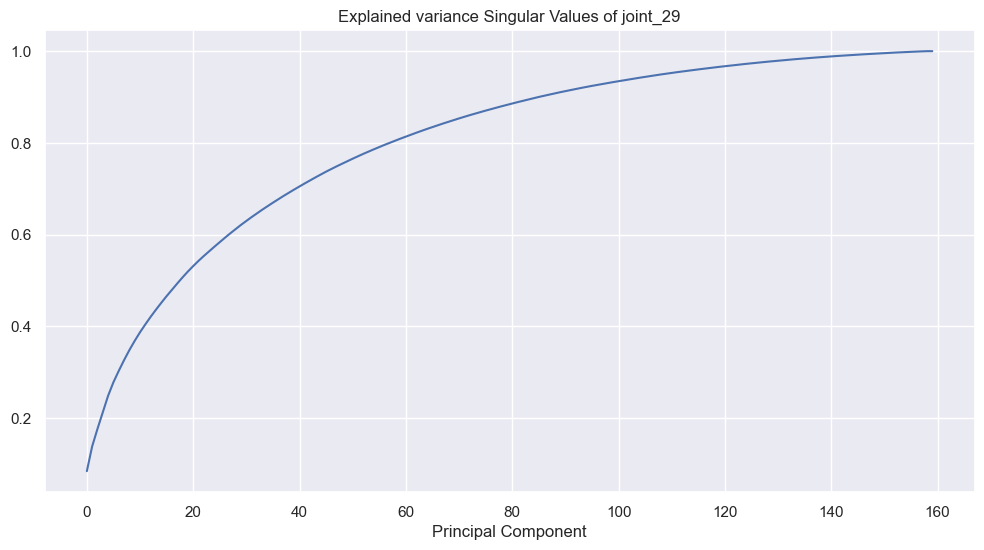

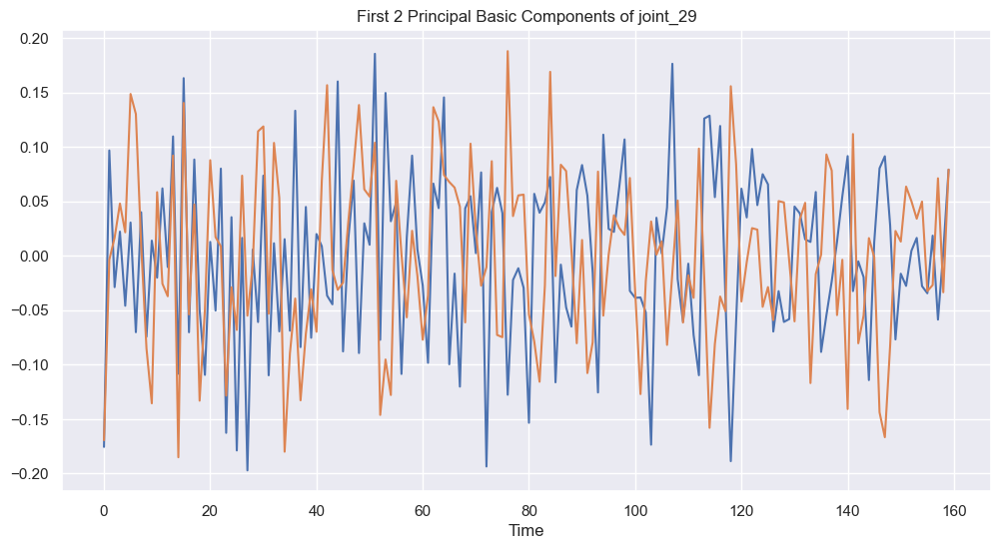

In [23]:
for i, featureName in enumerate(featureNames):
    series = data[:, :, i].T
    series -= np.mean(series, axis=0)
    U, s, Vt = np.linalg.svd(series, full_matrices=False)
    plt.figure(figsize=(12, 6))
    plt.plot(np.cumsum(s**2)/np.sum(s**2))
    plt.title(f'Explained variance Singular Values of {featureName}')
    plt.xlabel('Principal Component')
    plt.show()

    #Plot first 2 principal basic components
    basis = U[:2, :]
    plt.figure(figsize=(12, 6))
    plt.plot(basis.T)
    plt.title(f'First 2 Principal Basic Components of {featureName}')
    plt.xlabel('Time')
    plt.show()

In [29]:
X_train.head()

,sample_index,time,pain_survey_1,pain_survey_2,pain_survey_3,pain_survey_4,joint_00,joint_01,joint_02,joint_03,...,joint_20,joint_21,joint_22,joint_23,joint_24,joint_25,joint_26,joint_27,joint_28,joint_29
0,0,0,2,0,2,1,1.094705,0.985281,1.018302,1.010385,...,6.140248e-07,3.499558e-06,1.945042e-06,0.000004,1.153299e-05,0.000004,0.017592,0.013508,0.026798,0.027815
1,0,1,2,2,2,2,1.135183,1.021175,0.994343,1.052364,...,1.931978e-06,3.976952e-07,6.765107e-07,0.000006,4.643774e-08,0.000000,0.013352,0.000000,0.013377,0.013716
2,0,2,2,0,2,2,1.080745,0.962842,1.009588,0.977169,...,5.730838e-07,1.533820e-07,1.698525e-07,0.000001,2.424536e-06,0.000003,0.016225,0.008110,0.024097,0.023105
3,0,3,2,2,2,2,0.938017,1.081592,0.998021,0.987283,...,3.677486e-05,1.006865e-05,5.511079e-07,0.000002,5.432416e-08,0.000000,0.011832,0.007450,0.028613,0.024648
4,0,4,2,2,2,2,1.090185,1.032145,1.008710,0.963658,...,2.037939e-05,4.437266e-06,1.735459e-07,0.000002,5.825366e-08,0.000007,0.005360,0.002532,0.033026,0.025328


In [30]:
X_test = X_test.drop(columns=['n_legs', 'n_hands', 'n_eyes', 'joint_30'])

In [31]:
fullData = pd.concat([X_train, X_test], ignore_index=True)
fullData.head()

,sample_index,time,pain_survey_1,pain_survey_2,pain_survey_3,pain_survey_4,joint_00,joint_01,joint_02,joint_03,...,joint_20,joint_21,joint_22,joint_23,joint_24,joint_25,joint_26,joint_27,joint_28,joint_29
0,0,0,2,0,2,1,1.094705,0.985281,1.018302,1.010385,...,6.140248e-07,3.499558e-06,1.945042e-06,0.000004,1.153299e-05,0.000004,0.017592,0.013508,0.026798,0.027815
1,0,1,2,2,2,2,1.135183,1.021175,0.994343,1.052364,...,1.931978e-06,3.976952e-07,6.765107e-07,0.000006,4.643774e-08,0.000000,0.013352,0.000000,0.013377,0.013716
2,0,2,2,0,2,2,1.080745,0.962842,1.009588,0.977169,...,5.730838e-07,1.533820e-07,1.698525e-07,0.000001,2.424536e-06,0.000003,0.016225,0.008110,0.024097,0.023105
3,0,3,2,2,2,2,0.938017,1.081592,0.998021,0.987283,...,3.677486e-05,1.006865e-05,5.511079e-07,0.000002,5.432416e-08,0.000000,0.011832,0.007450,0.028613,0.024648
4,0,4,2,2,2,2,1.090185,1.032145,1.008710,0.963658,...,2.037939e-05,4.437266e-06,1.735459e-07,0.000002,5.825366e-08,0.000007,0.005360,0.002532,0.033026,0.025328


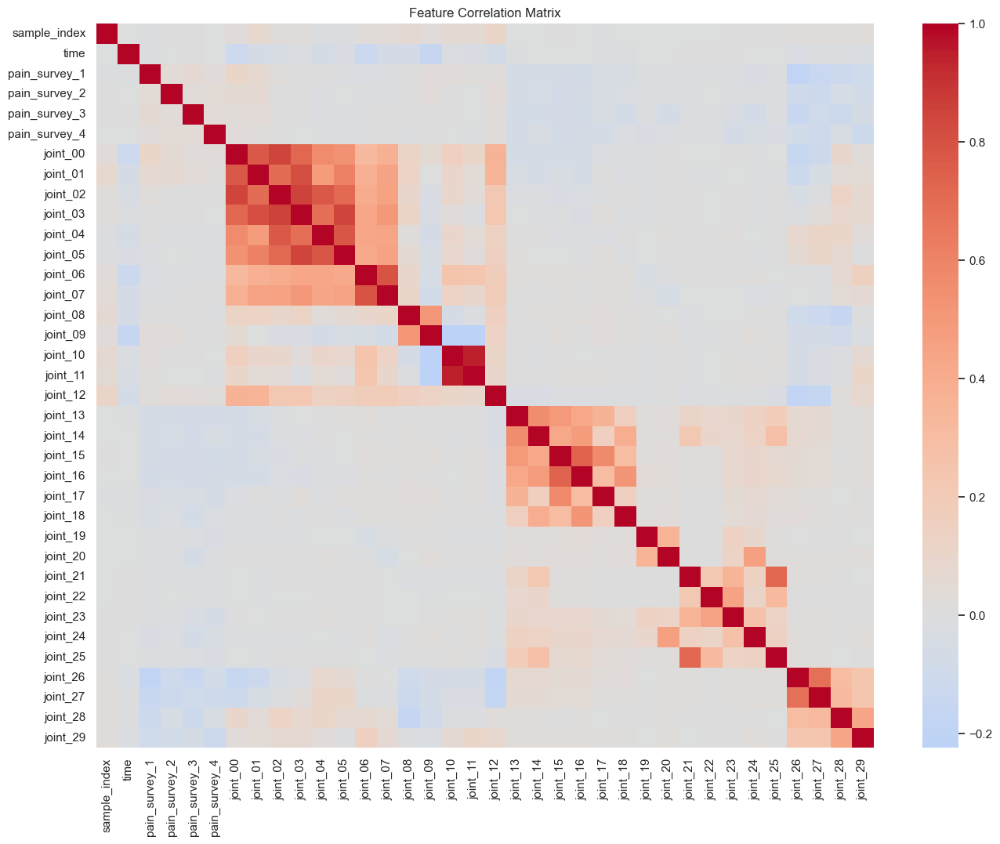

In [32]:
# Analyze correlation between features in fullData
corrMatrix = fullData.corr()
plt.figure(figsize=(16, 12))
sns.heatmap(corrMatrix, annot=False, cmap='coolwarm', center=0)
plt.title('Feature Correlation Matrix')
plt.show()

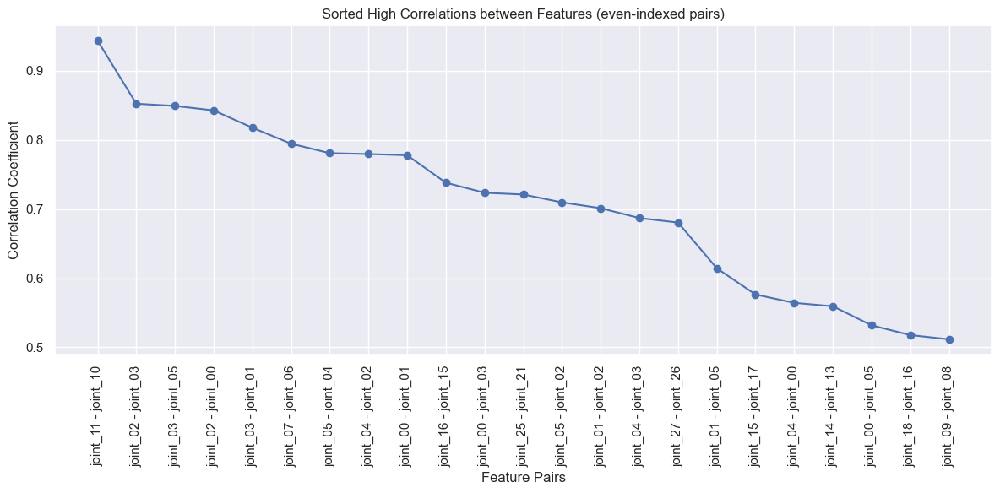

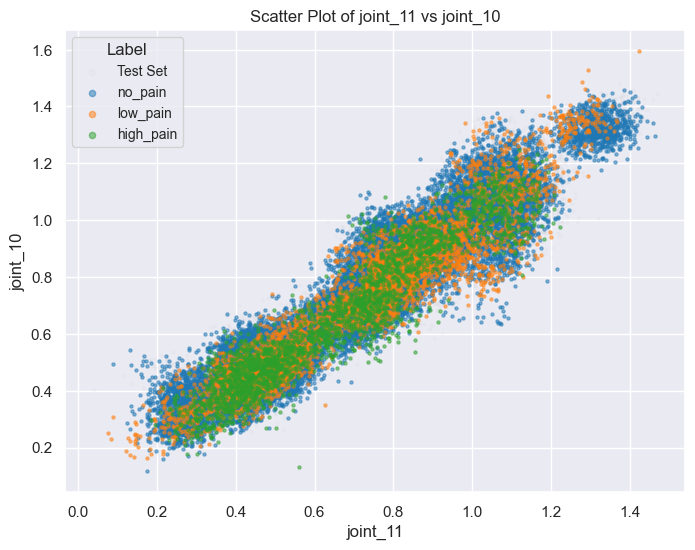

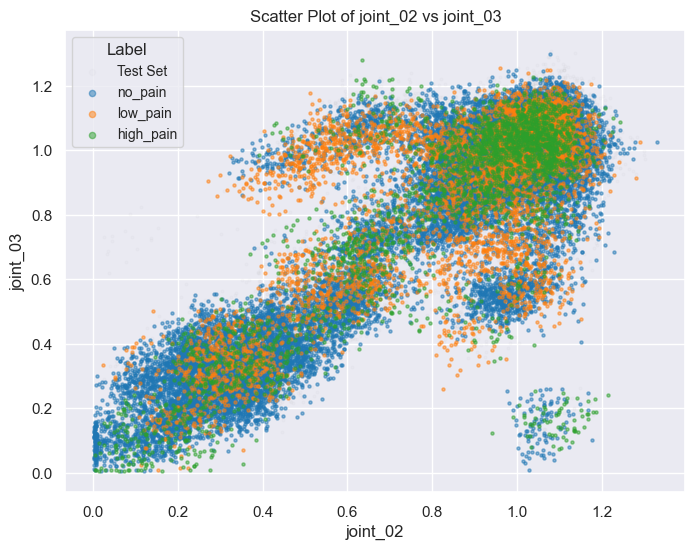

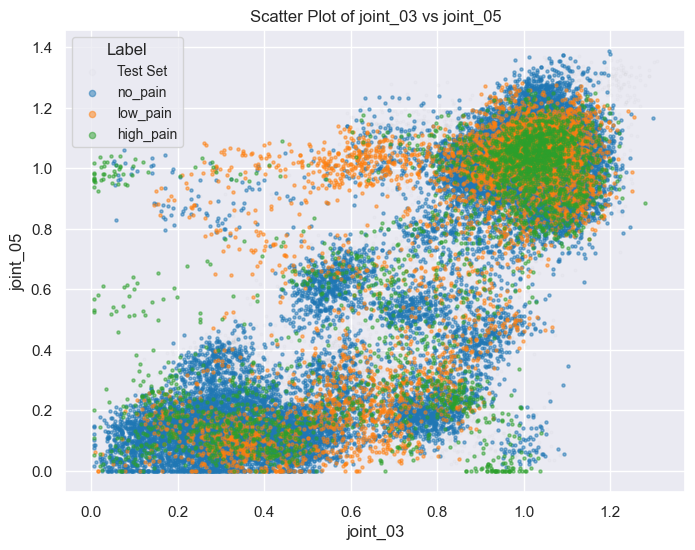

In [50]:
# Find the most correlated features
correlation_threshold = 0.5
corr_pairs = corrMatrix.unstack()

high_corr = corr_pairs[(abs(corr_pairs) > correlation_threshold) & (corr_pairs != 1)]

# plot the sorted high correlations with feature-pair x labels
sorted_high_corr = high_corr.sort_values(ascending=False)
# take only even-indexed entries to avoid duplicate pairs (A-B and B-A)
sorted_even = sorted_high_corr.iloc[::2]
pair_labels = [f'{a} - {b}' for a, b in sorted_even.index]

plt.figure(figsize=(12, 6))
plt.plot(sorted_even.values, marker='o')
plt.xticks(range(len(sorted_even)), pair_labels, rotation=90)
plt.title('Sorted High Correlations between Features (even-indexed pairs)')
plt.xlabel('Feature Pairs')
plt.ylabel('Correlation Coefficient')
plt.tight_layout()
plt.show()

#For the top 3 make a scatter plot of the two features, coloring points by label when possible
top3_pairs = sorted_even.index[:3]
label_map = y_train.set_index('sample_index')['label']  # map sample_index -> label (training samples)

for featA, featB in top3_pairs:
    df = fullData[[featA, featB, 'sample_index']].copy()
    df['label'] = df['sample_index'].map(label_map).fillna('Test Set')

    # subsample for plotting if the dataframe is very large
    max_points = 50000
    if len(df) > max_points:
        df = df.sample(n=max_points, random_state=42)

    plt.figure(figsize=(8, 6))
    cmap = plt.get_cmap('tab10')

    # draw Test Set (gray) first with very low alpha so training points appear on top
    if 'Test Set' in df['label'].values:
        subset_test = df[df['label'] == 'Test Set']
        plt.scatter(subset_test[featA], subset_test[featB], alpha=0.02, s=5, color='gray', label='Test Set')

    # then draw training labels on top with higher alpha
    for i, lbl in enumerate(labels):
        if lbl in df['label'].values:
            color = cmap(i % 10)
            subset = df[df['label'] == lbl]
            plt.scatter(subset[featA], subset[featB], alpha=0.5, s=5, color=color, label=lbl)

    plt.title(f'Scatter Plot of {featA} vs {featB}')
    plt.xlabel(featA)
    plt.ylabel(featB)
    plt.legend(title='Label', fontsize='small', markerscale=2)
    plt.show()

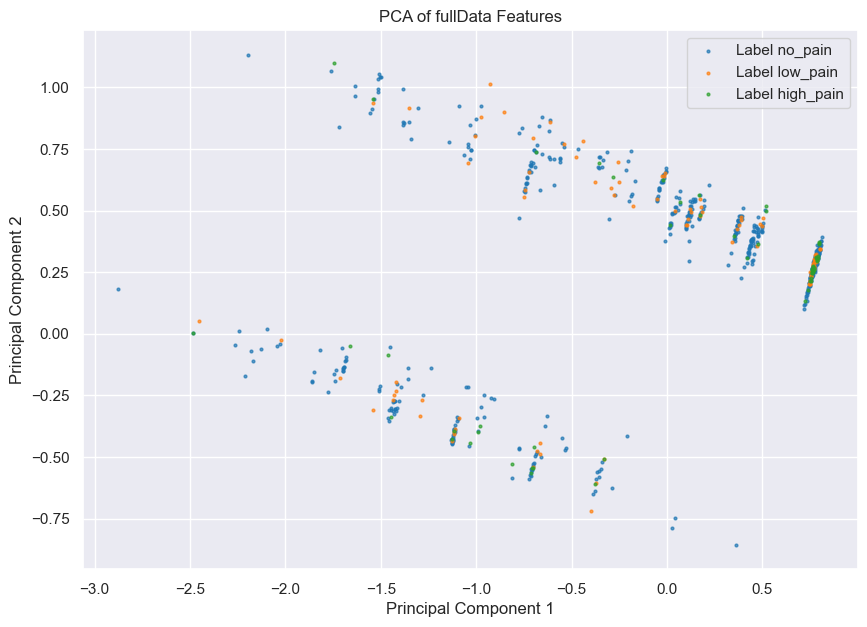

In [37]:
# Perform PCA over the fullData features
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pcaResults = pca.fit_transform(fullData.drop(['sample_index', 'time'], axis=1))


plt.figure(figsize=(10, 7))
#Color by label if in training set, else gray
labels_full = pd.concat([y_train['label'], pd.Series([-1]*X_test.shape[0])], ignore_index=True)
for li, label in enumerate(labels_full.unique()):
    label_indices = labels_full[labels_full == label].index
    color = plt.get_cmap('tab10')(li % 10) if label != -1 else 'gray'  # cycle through tab10 colors safely
    label_name = f'Label {label}' if label != -1 else 'Test Set'
    if color == 'gray':
        break
    plt.scatter(pcaResults[label_indices, 0], pcaResults[label_indices, 1], label=label_name, alpha=0.7, color=color, s=4)
# plt.scatter(pcaResults[:, 0], pcaResults[:, 1], alpha=0.5, s=4)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of fullData Features')
plt.legend()
plt.show()

In [41]:
pcaResults.shape

(317600, 2)

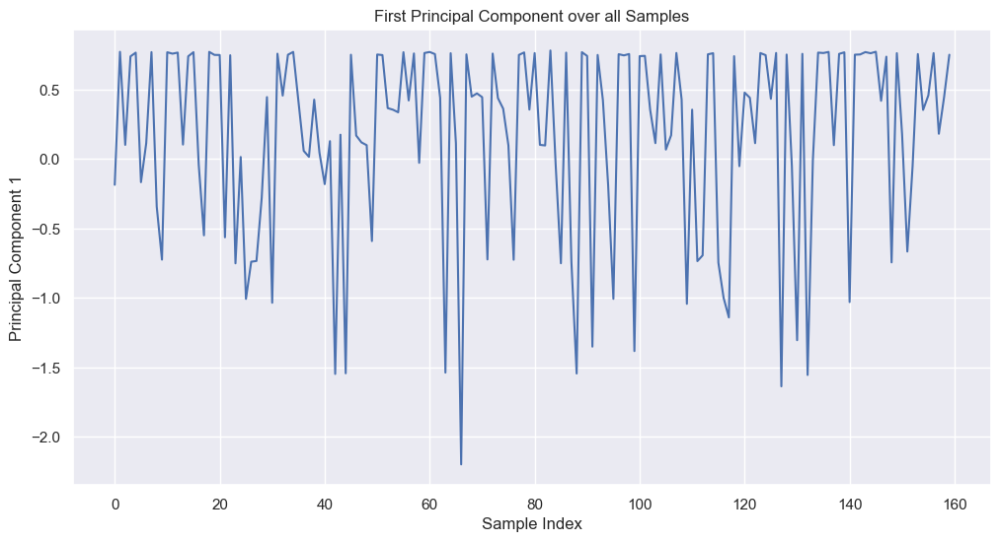

In [40]:
# Using the Principla components over the whole dataset plot the coordinates of the first principal component of one time serires
plt.figure(figsize=(12, 6))
plt.plot(pcaResults[:160, 0])
plt.title('First Principal Component over all Samples')
plt.xlabel('Sample Index')
plt.ylabel('Principal Component 1')
plt.show()